# Library

In [27]:
import pandas as pd
import re
import numpy as np

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt

import warnings
warnings.filterwarnings('ignore')

# Import data + new var

In [30]:
df = pd.read_csv('FedSpeechesWithNewVarExtended.csv', parse_dates = ['date'])
print(df.shape)
df.head()

(7240, 75)


,District,MultSpeakers,VideoForm,Article,content,title,speaker,location,link,date,...,flesch_reading_ease,flesch_kincaid_grade,smog,gunning_fog,automated_readability_index,coleman_liau_index,lix,rix,first_order_coherence,second_order_coherence
0,Boston,0.0,False,False,"Economic Resilience, Amid Elevated Tariffs and...",Perspectives on the Economy from Susan M. Collins,Susan M. Collins,"Massachusetts towns of Fall River, New Bedford...",https://www.bostonfed.org/news-and-events/spee...,2025-06-25,...,44.329367,13.980255,15.169125,17.509585,17.256897,14.084854,60.426681,9.069767,0.526444,0.511636
1,Boston,0.0,False,False,I am pleased to welcome all of you to the Fede...,Welcoming Remarks at the forum on “Meeting the...,Susan M. Collins,Federal Reserve Bank of Boston,https://www.bostonfed.org/news-and-events/spee...,2024-09-30,...,46.478313,12.516994,14.296648,15.858004,14.896570,13.845811,56.337437,7.678571,0.387757,0.416154
2,Boston,0.0,False,False,Takeaways from Boston Fed President Susan M. C...,A Partnership for Progress,Susan M. Collins,"Lawrence, Massachusetts",https://www.bostonfed.org/news-and-events/spee...,2024-06-18,...,54.190587,10.954297,13.161301,14.292075,13.416125,13.102487,52.760610,6.685315,0.381271,0.397782
3,Boston,0.0,False,False,Boston Fed President and CEO Susan M. Collins'...,Reflections on Uncertainty and Patience in Mon...,Susan M. Collins,"Cambridge, Massachusetts",https://www.bostonfed.org/news-and-events/spee...,2024-05-08,...,50.613530,11.944837,14.295085,15.858275,14.835373,13.758830,53.964692,7.131737,0.452981,0.446677
4,Boston,1.0,True,False,"hi, good afternoon everyone. my name is Beth B...",Remarks for the National Association of Corpor...,Susan M. Collins,Federal Reserve Bank of Boston,https://www.bostonfed.org/news-and-events/spee...,2024-04-16,...,71.294623,9.308595,11.003577,12.800382,10.815551,8.169472,42.031853,4.320000,0.375190,0.361304


In [32]:
print(df['date'].min())
print(df['date'].max())


1986-01-06 00:00:00
2025-12-15 00:00:00


## Some data manipulation to clean up the name and role of members

In [35]:
# creating this upperbound of strain
df['upStrain'] = df['dependency_distance_mean']+2*df['dependency_distance_std']

In [36]:
#fixing up board governors names duplication and complications
# fixing up the data:
# Duplicate names
dupNameList = {
    # Powell
    "Jerome H Powell": "Jerome H. Powell",
    "Chair Jerome H. Powell": "Jerome H. Powell",

    # Bowman
    "Michelle W Bowman": "Michelle W. Bowman",
    "Governor Michelle W. Bowman": "Michelle W. Bowman",
    "Vice Chair for Supervision Michelle W. Bowman": "Michelle W. Bowman",

    # Waller
    "Christopher J Waller": "Christopher J. Waller",
    "Governor Christopher J. Waller": "Christopher J. Waller",

    # Cook
    "Lisa D Cook": "Lisa D. Cook",
    "Governor Lisa D. Cook": "Lisa D. Cook",

    # Barr
    "Michael S Barr": "Michael S. Barr",
    "Governor Michael S. Barr": "Michael S. Barr",
    "Vice Chair for Supervision Michael S. Barr": "Michael S. Barr",

    # Jefferson
    "Philip N Jefferson": "Philip N. Jefferson",
    "Vice Chair Philip N. Jefferson": "Philip N. Jefferson",

    # Lindsey
    "Lawrence Lindsey": "Lawrence B. Lindsey",
    "Lawrence B Lindsey": "Lawrence B. Lindsey",

    #
    "Janet L Yellen":"Janet L. Yellen",

    # Non-governor (flag)
    "Brian F Madigan": None,   # staff, not a governor

    # New York
        # --- Presidents (canonical forms) ---
    "William C Dudley": "William C. Dudley",
    "William J McDonough": "William J. McDonough",
    "John C Williams": "John C. Williams",
    "John C. Williams,": "John C. Williams",
    "John C. Williams, President and Chief Executive Officer": "John C. Williams",
    "John C. Williams, President and Chief Executive Officer ": "John C. Williams",

    # --- Timothy Geithner ---
    "Timothy F Geithner": "Timothy F. Geithner",

    # --- Simon Potter ---
    "Simon M Potter": "Simon M. Potter",
    "Simon Potter": "Simon M. Potter",

    # --- Nathaniel Wuerffel ---
    "NathanielWuerffel": "Nathaniel Wuerffel",
    "Nathaniel Wuerffel": "Nathaniel Wuerffel",

    # --- Michelle Neal ---
    "Michelle Neal": "Michelle Neal",
    "Michelle Neal, Head of the Markets Group": "Michelle Neal",

    # San Francisco
    "Mary C Daly": "Mary C. Daly",
    "Mary C. Daly": "Mary C. Daly",
    "Robert T Parry": "Robert T. Parry",
    "Janet L Yellen": "Janet L. Yellen",

    # Chicago
    "Michael Moskow": "Michael H. Moskow",
    "Michael H Moskow": "Michael H. Moskow",

    "Charles L Evans": "Charles L. Evans",

    "Austan D Goolsbee": "Austan D. Goolsbee",
    "Austan D. Goolsbee": "Austan D. Goolsbee",
    "Austan Goolsbee": "Austan D. Goolsbee",

    # Cleveland
    "Loretta J Mester": "Loretta J. Mester",
    "Loretta J. Mester": "Loretta J. Mester",
    "Jerry L Jordan": "Jerry L. Jordan",
    "W Lee Hoskins": "W. Lee Hoskins",
    "Beth M. Hammack": "Beth M. Hammack",

    # Philadelphia
    "Patrick T Harker": "Patrick T. Harker",
    "Patrick T. Harker": "Patrick T. Harker",
    "Charles I Plosser": "Charles I. Plosser",
    "Anthony M Santomero": "Anthony M. Santomero",
    "Edward G Boehne": "Edward G. Boehne",

    # St. Louis
    "Alberto Musalem": "Alberto G. Musalem",
    "Alberto G Musalem": "Alberto G. Musalem",
    "Alberto G. Musalem ": "Alberto G. Musalem",
    "Thomas C Melzer": "Thomas C. Melzer",

    # Boston
    "Susan M. Collins": "Susan M. Collins",
    "Susan M Collins": "Susan M. Collins",
    "By Susan M. Collins": "Susan M. Collins",
    "Eric S Rosengren": "Eric S. Rosengren",
    "Cathy E Minehan": "Cathy E. Minehan",
    "Paul M Connolly": "Paul M. Connolly",
    "Kenneth C Montgomery": "Kenneth C. Montgomery",
    "Lynn E Browne": "Lynn E. Browne",

    # Dallas
    "Lorie K. Logan": "Lorie K. Logan",
    "Lorie K Logan": "Lorie K. Logan",
    "Lorie Logan": "Lorie K. Logan",
    "Richard W Fisher": "Richard W. Fisher",
    "Robert D McTeer": "Robert D. McTeer",
    "Robert S Kaplan": "Robert S. Kaplan",

    # Kansas
    "Jeff Schmid": "Jeffrey Schmid",
    "Jeff Schmid ": "Jeffrey Schmid",
    "Jeffrey Schmid": "Jeffrey Schmid",
    "Thomas M Hoenig": "Thomas M. Hoenig",
    "Esther L George": "Esther L. George",

    # Richmond
    "J Alfred Broaddus":"J. Alfred Broaddus",
    "Jeffrey M Lacker":"Jeffrey M. Lacker",

    # Minneapolis
    "Gary H Stern":"Gary H. Stern",

    #
    "Robert P Forrestal":"Robert P. Forrestal",
    "Kartik Athreya":"Kartik B. Athreya"
}


df["speaker"] = df["speaker"].replace(dupNameList)
df = df[df["speaker"].notna()]


In [41]:
# This is to create a new column indicate if a person is a board chair or board vice chair
# HIGHLY LIKE TO BE WRONG, NEED MORE CHECKING
role_periods = {

    # Chairs
    "Alan Greenspan": [
        ("1987-08-11", "2006-01-31", "Chair")
    ],
    "Ben S Bernanke": [
        ("2002-08-05", "2005-01-31", "Governor"),
        ("2006-02-01", "2014-01-31", "Chair")
    ],
    "Janet L. Yellen": [
        ("1994-08-12", "1997-02-17", "Governor"),
        ("2010-10-04", "2014-02-03", "Vice Chair"),
        ("2014-02-03", "2018-02-03", "Chair")
    ],
    "Jerome H. Powell": [
        ("2012-05-25", "2018-02-05", "Governor"),
        ("2018-02-05", "2100-01-01", "Chair")
    ],
    "Paul A Volcker": [
        ("1975-08-06", "1979-08-06", "Governor"),
        ("1979-08-06", "1987-08-11", "Chair")
    ],

    # Vice Chairs
    "Roger W Ferguson": [
        ("1997-11-05", "1999-10-05", "Governor"),
        ("1999-10-05", "2006-04-28", "Vice Chair")
    ],
    "Donald L Kohn": [
        ("2002-08-05", "2006-06-23", "Governor"),
        ("2006-06-23", "2010-09-01", "Vice Chair")
    ],
    "Stanley Fischer": [
        ("2014-05-28", "2017-10-13", "Vice Chair")
    ],
    "Richard H Clarida": [
        ("2018-09-17", "2022-01-14", "Vice Chair")
    ],
    "Lael Brainard": [
        ("2014-06-16", "2022-05-23", "Governor"),
        ("2022-05-23", "2023-02-18", "Vice Chair")
    ],
    "Philip N. Jefferson": [
        ("2022-05-23", "2023-09-13", "Governor"),
        ("2023-09-13", "2100-01-01", "Vice Chair")
    ],
    "David W Mullins": [
        ("1990-05-21", "1991-07-24", "Governor"),
        ("1991-07-24", "1994-02-14", "Vice Chair")
    ],
    "Manuel H Johnson": [
        ("1986-02-07", "1986-08-04", "Governor"),
        ("1986-08-04", "1990-08-03", "Vice Chair")
    ],
    "Alice M Rivlin": [
        ("1996-06-25", "1999-07-16", "Vice Chair")
    ],
    "Alan S Blinder": [
        ("1994-06-27", "1996-01-31", "Vice Chair")
    ],
    "Preston Martin": [
        ("1982-03-31", "1986-04-30", "Vice Chair")
    ],

    # Everyone else = Governor only
    "Michelle W. Bowman": [
        ("2018-11-26", "2100-01-01", "Governor")
    ],
    "Lael Brainard": [
        ("2014-06-16", "2022-05-23", "Governor"),
        ("2022-05-23", "2023-02-18", "Vice Chair")
    ],
    "John Patrick LaWare": [
        ("1988-08-15", "1995-04-30", "Governor")
    ],
    "Laurence H Meyer": [
        ("1996-06-20", "2002-01-31", "Governor")
    ],
    "Daniel K Tarullo": [
        ("2009-01-28", "2017-04-05", "Governor")
    ],
    "Susan Schmidt Bies": [
        ("2001-12-07", "2007-03-30", "Governor")
    ],
    "Christopher J. Waller": [
        ("2020-12-18", "2100-01-01", "Governor")
    ],
    "Edward M Gramlich": [
        ("1997-11-05", "2005-08-31", "Governor")
    ],
    "Randal K Quarles": [
        ("2017-10-13", "2021-12-25", "Governor")
    ],
    "Susan M Phillips": [
        ("1991-12-02", "1998-06-30", "Governor")
    ],
    "Mark W Olson": [
        ("2001-12-07", "2006-06-21", "Governor")
    ],
    "Elizabeth A Duke": [
        ("2008-08-05", "2013-08-31", "Governor")
    ],
    "Edward W Kelley": [
        ("1987-05-26", "2001-12-31", "Governor")
    ],
    "Michael S. Barr": [
        ("2022-07-19", "2100-01-01", "Governor")
    ],
    "Randall S Kroszner": [
        ("2006-03-01", "2009-01-21", "Governor")
    ],
    "Lisa D. Cook": [
        ("2022-05-23", "2100-01-01", "Governor")
    ],
    "Lawrence B. Lindsey": [
        ("1991-11-26", "1997-02-05", "Governor")
    ],
    "Wayne D Angell": [
        ("1986-02-07", "1994-02-09", "Governor")
    ],
    "H Robert Heller": [
        ("1986-08-19", "1989-07-31", "Governor")
    ],
    "Frederic S Mishkin": [
        ("2006-09-05", "2008-08-31", "Governor")
    ],
    "Adriana D. Kugler": [
        ("2023-09-08", "2100-01-01", "Governor")
    ],
    "Kevin M Warsh": [
        ("2006-02-24", "2011-03-31", "Governor")
    ],
    "Sarah Bloom Raskin": [
        ("2010-10-04", "2014-03-13", "Governor")
    ],
    "Martha Romayne Seger": [
        ("1984-07-02", "1991-03-11", "Governor")
    ],
    "Jeremy C Stein": [
        ("2012-05-30", "2014-05-28", "Governor")
    ],
    "Emmett John Rice": [
        ("1979-06-20", "1986-12-31", "Governor")
    ],
    "Stephen I. Miran": [
        ("2025-09-16", "2100-01-01", "Governor")
    ]
}

def get_role(name, date):
    date = pd.to_datetime(date)

    if name not in role_periods:
        return "Governor"

    for start, end, role in role_periods[name]:
        if pd.to_datetime(start) <= date <= pd.to_datetime(end):
            return role

    return "Governor"

df["date"] = pd.to_datetime(df["date"])

mask = df["District"] == "BoardGovernors"

df.loc[mask, "board_role"] = df.loc[mask].apply(
    lambda row: get_role(row["speaker"], row["date"]),
    axis=1
)

df["board_role"] = df["board_role"].fillna("Not Board")
print(df['District'].value_counts())
print(df['board_role'].value_counts())


District
BoardGovernors    2880
NewYork            668
Atlanta            544
SanFrancisco       461
Chicago            431
StLouis            412
Cleveland          371
Philadelphia       301
Richmond           284
Dallas             258
Boston             255
Kansas             189
Minneapolis        185
Name: count, dtype: int64
board_role
Not Board     4359
Governor      1588
Chair          896
Vice Chair     396
Name: count, dtype: int64


In [42]:
# This is to create indicator for presidents versus any other roles in bank
presidentList = [
    "William J. McDonough",
    "Timothy F. Geithner",
    "William C. Dudley",
    "John C. Williams",
    
    "Robert P. Forrestal",
    "Jack Guynn",
    "Dennis Lockhart",
    "Raphael Bostic",

    "Robert T. Parry",
    "John C. Williams",
    "Mary C. Daly",

    "Michael H. Moskow",
    "Charles L. Evans",
    "Austan D. Goolsbee",

    "W. Lee Hoskins",
    "Jerry L. Jordan",
    "Sandra Pianalto",
    "Loretta J. Mester",

    "Edward G. Boehne",
    "Anthony M. Santomero",
    "Charles I. Plosser",
    "Patrick T. Harker",

    "J. Alfred Broaddus",
    "Jeffrey M. Lacker",
    "Tom Barkin",

    "Thomas C. Melzer",
    "William Poole",
    "James Bullard",
    "Alberto G. Musalem",

    "Cathy E. Minehan",
    "Eric S. Rosengren",
    "Susan M. Collins",

    "Robert D. McTeer",
    "Richard W. Fisher",
    "Robert S. Kaplan",
    "Lorie K. Logan",

    "Thomas M. Hoenig",
    "Esther L. George",
    "Jeffrey Schmid",

    "Gary H. Stern",
    "Narayana Kocherlakota",
    "Neel Kashkari"
]

df["IsBpres"] = df["speaker"].isin(presidentList)
df.loc[
    (df['speaker'] == "Janet L. Yellen") & (df['board_role'] == 'Not Board'),
    'IsBpres'
] = True

df.loc[
    (df['speaker'] == "Janet L. Yellen") & (df['board_role'] != 'Not Board'),
    'IsBpres'
] = False


print(df['District'].value_counts())
print(df['IsBpres'].value_counts())


District
BoardGovernors    2880
NewYork            668
Atlanta            544
SanFrancisco       461
Chicago            431
StLouis            412
Cleveland          371
Philadelphia       301
Richmond           284
Dallas             258
Boston             255
Kansas             189
Minneapolis        185
Name: count, dtype: int64
IsBpres
True     4010
False    3229
Name: count, dtype: int64


In [43]:
bankList = ['NewYork', 'Atlanta', 'SanFrancisco', 'Chicago', 'Cleveland', 'Philadelphia', 'Richmond',
           'StLouis', 'Boston', 'Dallas', 'Kansas','Minneapolis']
for bank in bankList:
    print(bank)
    print(df[(df['District'] == bank)]['speaker'].value_counts().index.sort_values())
    print('\n')

NewYork
Index(['Alberto G. Musalem', 'Anna Kovner', 'Anna Nordstrom', 'Beverly Hirtle',
       'Brian P Sack', 'Chester B Feldberg', 'Chris Calabia',
       'Christine M Cumming', 'Daleep Singh', 'Daniel K Tarullo',
       'David Erickson', 'Dianne Dobbeck', 'Dino Kos', 'Ernest T Patrikis',
       'Jack Gutt', 'James Bergin', 'James Hennessy', 'James McAndrews',
       'Jamie B Stewart', 'Jeanmarie Davis', 'John C. Williams',
       'Joseph S Tracy', 'Joshua Rosenberg', 'Joyce M Hansen', 'Julie Remache',
       'Kartik B. Athreya', 'Kevin Stiroh', 'Lacey Dingman', 'Linda Goldberg',
       'Linda S. Goldberg', 'Lorie K. Logan', 'Michael Alix', 'Michael Held',
       'Michael Strine', 'Michelle Neal', 'Mihaela Nistor',
       'Nathaniel Wuerffel', 'Patricia Zobel', 'Peter R Fisher', 'Ray Testa',
       'Richard Dzina', 'Richard Ostrander', 'Roberto Perli',
       'Sandra C Krieger', 'Sarah Dahlgren', 'Simon M. Potter',
       'Terrence J Checki', 'Thomas C Baxter', 'Til Schuermann',
    

In [46]:
print(df.columns.tolist())

['District', 'MultSpeakers', 'VideoForm', 'Article', 'content', 'title', 'speaker', 'location', 'link', 'date', 'positiveFin', 'neutralFin', 'negativeFin', 'hawkishMal', 'n_hawk_pair', 'n_dove_pair', 'concreteness', 'concretenessExtra', 'concreteRatio', 'concreteMean', 'concrete25', 'concreteMeanExtra', 'concrete25Extra', 'token_length_mean', 'token_length_median', 'token_length_std', 'sentence_length_mean', 'sentence_length_median', 'sentence_length_std', 'syllables_per_token_mean', 'syllables_per_token_median', 'syllables_per_token_std', 'n_tokens', 'n_unique_tokens', 'proportion_unique_tokens', 'n_characters', 'n_sentences', 'entropy', 'perplexity', 'per_word_perplexity', 'dependency_distance_mean', 'dependency_distance_std', 'prop_adjacent_dependency_relation_mean', 'prop_adjacent_dependency_relation_std', 'passed_quality_check', 'n_stop_words', 'alpha_ratio', 'mean_word_length', 'doc_length', 'symbol_to_word_ratio_#', 'proportion_ellipsis', 'proportion_bullet_points', 'contains_lo

In [51]:
print(df.shape)

(7239, 78)


In [53]:
# export so that I can check immediately
df.to_csv('FedSpeechesCleaned.csv', date_format='%Y-%m-%d', index = False)


# PC components

In [120]:
import os
import re
import string
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


In [122]:
def bartlettSphericity(df, pthreshold = 0.05):
    chi_square_value, p_value = calculate_bartlett_sphericity(df)
    print("The p-value = "+ str(p_value))
    if p_value <pthreshold:
        print('Significant at 5%, the observered matrix is not an identity matrix')
    else:
        print('There are likely little correlation')
    return p_value

def getPC(df, varList, numComp):
    df = df.reset_index(drop=True)
    dfPrep = df[varList].copy()
    # need to drop missing value if any
    dfPrep = dfPrep.dropna()
    indexNonM = dfPrep.index.tolist()
    
    XScaled = StandardScaler().fit_transform(dfPrep.values)
    dfXScaled = pd.DataFrame(XScaled, index=dfPrep.index, columns=dfPrep.columns)
    
    pca = PCA(n_components=numComp)
    pca_features = pca.fit_transform(XScaled)
 
    pca_df = pd.DataFrame(
        data=pca_features, 
        columns=['PC'+str(i+1) for i in range(numComp)])
    pca_df.index = indexNonM
    
    res = df.join(pca_df)
    return res

def combineVar(df, varList, numComp, name, drop= True, printBartlett = True, printCorr = False, printMissing = False):
    if name in df.columns.tolist():
        df = df.drop(columns = [name])
    df0 = df[varList].copy()
    if printBartlett:
        bartP = bartlettSphericity(df0.dropna(), pthreshold = 0.05)
    if printMissing:
        print(df0.isnull().sum())

    df1 = getPC(df, varList, numComp)
    df1.rename(columns = {'PC1':name}, inplace = True)

    if printCorr:
        print(df1[varList+[name]].corr()[[name]])
    if drop:
        df1.drop(columns = varList, inplace = True)
    if printBartlett:
        return df1, bartP
    else:
        return df1



In [123]:
print(df.columns.tolist())


['District', 'MultSpeakers', 'VideoForm', 'Article', 'content', 'title', 'speaker', 'location', 'link', 'date', 'positiveFin', 'neutralFin', 'negativeFin', 'hawkishMal', 'n_hawk_pair', 'n_dove_pair', 'concreteness', 'concretenessExtra', 'concreteRatio', 'concreteMean', 'concrete25', 'concreteMeanExtra', 'concrete25Extra', 'token_length_mean', 'token_length_median', 'token_length_std', 'sentence_length_mean', 'sentence_length_median', 'sentence_length_std', 'syllables_per_token_mean', 'syllables_per_token_median', 'syllables_per_token_std', 'n_tokens', 'n_unique_tokens', 'proportion_unique_tokens', 'n_characters', 'n_sentences', 'entropy', 'perplexity', 'per_word_perplexity', 'dependency_distance_mean', 'dependency_distance_std', 'prop_adjacent_dependency_relation_mean', 'prop_adjacent_dependency_relation_std', 'passed_quality_check', 'n_stop_words', 'alpha_ratio', 'mean_word_length', 'doc_length', 'symbol_to_word_ratio_#', 'proportion_ellipsis', 'proportion_bullet_points', 'contains_lo

In [124]:
varMegaList = [['concreteness', 'concretenessExtra', 'concreteRatio', 'concreteMean', 'concrete25', 'concreteMeanExtra', 'concrete25Extra'],
               ['entropy'],
               ['flesch_reading_ease', 'flesch_kincaid_grade', 'smog', 'gunning_fog', 'automated_readability_index', 'coleman_liau_index', 'lix', 'rix'],
               ['first_order_coherence', 'second_order_coherence'],
               ['dependency_distance_mean'],
               ['upStrain']
              ]
allvar = varMegaList[0]
for i in varMegaList[1:]:
    allvar = allvar+i
nameList = ['abstract','info','read','disunity','strain','strainUpper']
df[allvar].isnull().sum()


concreteness                   0
concretenessExtra              0
concreteRatio                  0
concreteMean                   0
concrete25                     0
concreteMeanExtra              0
concrete25Extra                0
entropy                        0
flesch_reading_ease            0
flesch_kincaid_grade           0
smog                           0
gunning_fog                    0
automated_readability_index    0
coleman_liau_index             0
lix                            0
rix                            0
first_order_coherence          0
second_order_coherence         0
dependency_distance_mean       0
upStrain                       0
dtype: int64

In [125]:
dfPC = df.copy()

for var in [i for i in varMegaList[0] if i not in ['concreteRatio']]:
    dfPC[var+'flip'] = 6-dfPC[var]
dfPC['concreteRatioflip'] = 1/dfPC['concreteRatio'] #according to the summary stat, there is no 0
varMegaList[0] = [i+'flip' for i in varMegaList[0]]

numComp = 1
for i in range(len(nameList)):
    varList = varMegaList[i]
    name = nameList[i]
    print(name)
    if len(varList) == 1:
        dfPC = combineVar(dfPC, varList, numComp, name, drop= False, printBartlett = False, printCorr = False, printMissing = False)
    else:
        dfPC, pvalue = combineVar(dfPC, varList, numComp, name, drop= False, printBartlett = True, printCorr = True, printMissing = True)

# PC for readability suddenly side with the flesch reading ease so i have to flip the sign
dfPC['read'] = -dfPC['read']


abstract
The p-value = nan
There are likely little correlation
concretenessflip         0
concretenessExtraflip    0
concreteRatioflip        0
concreteMeanflip         0
concrete25flip           0
concreteMeanExtraflip    0
concrete25Extraflip      0
dtype: int64
                       abstract
concretenessflip       0.905866
concretenessExtraflip  0.794620
concreteRatioflip      0.815640
concreteMeanflip       0.905866
concrete25flip         0.905866
concreteMeanExtraflip  0.794620
concrete25Extraflip    0.794620
abstract               1.000000
info
read
The p-value = 0.0
Significant at 5%, the observered matrix is not an identity matrix
flesch_reading_ease            0
flesch_kincaid_grade           0
smog                           0
gunning_fog                    0
automated_readability_index    0
coleman_liau_index             0
lix                            0
rix                            0
dtype: int64
                                 read
flesch_reading_ease          0.998776

In [127]:
# simple correlations
mainVar = ['abstract','info','read','disunity','strain','strainUpper']
dfcheck = dfPC[mainVar]
with pd.option_context("display.max_columns", None):
    display(dfcheck.corr())
    

,abstract,info,read,disunity,strain,strainUpper
abstract,1.000000,0.100199,0.259049,0.274988,0.240660,0.116868
info,0.100199,1.000000,0.004177,0.103631,0.118767,0.183895
read,0.259049,0.004177,1.000000,0.669820,0.722843,0.492184
disunity,0.274988,0.103631,0.669820,1.000000,0.818451,0.376931
strain,0.240660,0.118767,0.722843,0.818451,1.000000,0.554012
strainUpper,0.116868,0.183895,0.492184,0.376931,0.554012,1.000000


# Potential abnormality (error in data)
- quality check: nothing seems abnormal, including meann word length

In [43]:
# coleman_liau_index is strangely not correlated highly with others - which rely on character per words
# this could be a sign of mistakened token that is extremely long and non-sense
# first check text quality
# Now we check for each country the quality of their texts on the variables given
# qualityCheck = ['passed_quality_check','n_stop_words', 'alpha_ratio', 'mean_word_length', 'doc_length', 
#                 'symbol_to_word_ratio_#', 'proportion_ellipsis', 'proportion_bullet_points', 'contains_lorem ipsum', 
#                 'duplicate_line_chr_fraction', 'duplicate_paragraph_chr_fraction', 'duplicate_ngram_chr_fraction_5', 
#                 'duplicate_ngram_chr_fraction_6', 'duplicate_ngram_chr_fraction_7', 'duplicate_ngram_chr_fraction_8', 
#                 'duplicate_ngram_chr_fraction_9', 'duplicate_ngram_chr_fraction_10', 'top_ngram_chr_fraction_2', 
#                 'top_ngram_chr_fraction_3', 'top_ngram_chr_fraction_4', 'oov_ratio']
qualityCheck = ['passed_quality_check','n_stop_words', 'alpha_ratio', 'mean_word_length', 'doc_length', 
                'symbol_to_word_ratio_#', 'proportion_bullet_points']
dfquality = dfPC[['District']+qualityCheck].groupby('District').mean()
dfquality.to_csv('results/qualityCheck.csv')
with pd.option_context("display.max_columns", None):
    display(dfquality)


,passed_quality_check,n_stop_words,alpha_ratio,mean_word_length,doc_length,symbol_to_word_ratio_#,proportion_bullet_points
District,,,,,,,
Atlanta,0.963235,1407.215074,0.890739,4.594533,3133.753676,0.000006,0.003676
BoardGovernors,0.963889,1468.425694,0.882294,4.786181,3608.820139,0.000005,0.000694
Boston,0.788235,1511.917647,0.867286,4.615881,3693.082353,0.000010,0.117647
Chicago,0.993039,1246.786543,0.873210,4.546963,3002.633411,0.000027,0.000000
Cleveland,0.948787,1484.622642,0.874987,4.651702,3612.619946,0.000031,0.000000
Dallas,0.984496,1480.728682,0.876829,4.459732,3465.065891,0.000006,0.000000
Kansas,0.968254,1168.613757,0.887594,4.721339,2787.835979,0.000007,0.000000
Minneapolis,0.929730,1856.935135,0.883266,4.489531,3911.859459,0.000007,0.000000
NewYork,0.959581,1423.354790,0.887175,4.708367,3395.282934,0.000004,0.000000


# Basic Graphs

In [135]:
bankList = ['NewYork', 'Atlanta', 'SanFrancisco', 'Chicago', 'Cleveland', 'Philadelphia', 'Richmond',
           'StLouis', 'Boston', 'Dallas', 'Kansas','Minneapolis']
bankPeriodList = [
    [#NewYork
      [1993, 1, 1],
      [2003, 1, 1],
      [2008, 1, 1],
      [2009, 1, 1],
      [2018, 1, 18]
    ],
    [#Atlanta
      [1996, 1, 1],
      [2006, 1, 1],
      [2007, 1, 1],
      [2017, 1, 1]
    ],
    [#SanFrancisco
      [1986, 1, 1],
      [2004, 1, 1],
      [2010, 1, 1],
      [2018, 1, 1]
    ],
    [#Chicago
      [1994, 1, 1],
      [2007, 1, 1],
      [2023, 1, 1]
    ],
    [#Cleveland
      [1987, 1, 1],
      [1992, 1, 1],
      [2003, 1, 1],
      [2014, 1, 1],
      [2024, 1, 1]
    ],
    [#Philadelphia
      [2000, 1, 1],
      [2006, 1, 1],
      [2015, 1, 1]
    ],
    [#Richmond
      [1992, 1, 1],
      [1993, 1, 1],
      [2004, 1, 1],
      [2018, 1, 1]
    ],
    [#St. Louis
      [1998, 1, 1],
      [2008, 1, 1],
      [2023, 1, 1]
    ],
    [#boston
      [1994, 1, 1],
      [2007, 1, 1],
      [2022, 1, 1]
    ],
    [#Dallas
      [1991, 1, 1],
      [2004, 1, 1],
      [2005, 1, 1],
      [2015, 1, 1],
      [2022, 1, 1]
    ],
    [#Kansas
      [1991, 1, 1],
      [2011, 1, 1],
      [2023, 1, 1]
    ],
    [#Minneapolis
      [2009, 1, 1],
      [2016, 1, 1]
    ] 
                 ]
chairPeriodList = [
    [1987, 8, 11],
    [2006, 1, 31],
    [2014, 1, 31],
    [2018, 2, 3]
]

## Monthly Patterns

In [59]:
# Define month period based on day of month
def get_period(day):
    if day <= 10:
        return 'Beginning'
    elif day <= 20:
        return 'Middle'
    else:
        return 'End'

# a function to reuse
def graphMonthlyPattern(df):
    # Create new columns for month and period
    df['month'] = df['date'].dt.month_name()
    df['period'] = df['date'].dt.day.apply(get_period)
    df["period"] = df["period"].astype(pd.api.types.CategoricalDtype(categories=["Beginning","Middle","End"]))
    
    # Group by year, month, and period to count speeches
    df['year'] = df['date'].dt.year
    grouped = df.groupby(['year', 'month', 'period']).size().reset_index(name='speech_count')
    
    # Now average across years
    avg_speeches = grouped.groupby(['month', 'period'])['speech_count'].mean().reset_index()
    
    # Sort months in calendar order
    month_order = ['January', 'February', 'March', 'April', 'May', 'June',
                   'July', 'August', 'September', 'October', 'November', 'December']
    avg_speeches['month'] = pd.Categorical(avg_speeches['month'], categories=month_order, ordered=True)
    avg_speeches = avg_speeches.sort_values(['month', 'period'])
    
    # Pivot for plotting
    pivot_df = avg_speeches.pivot(index='month', columns='period', values='speech_count')
    
    # Plotting
    pivot_df.plot(kind='bar', figsize=(12, 6))
    plt.title('Average Number of Speeches per Month Period (1985–2025)')
    plt.ylabel('Average Speech Count')
    plt.xlabel('Month')
    plt.xticks(rotation=45)
    plt.legend(title='Period of Month')
    plt.tight_layout()
    plt.show()


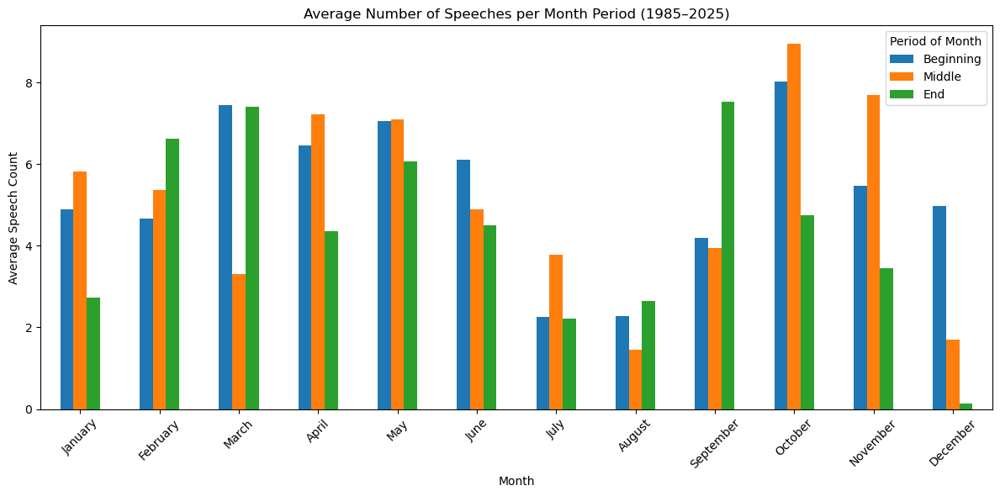

In [53]:
graphMonthlyPattern(df)


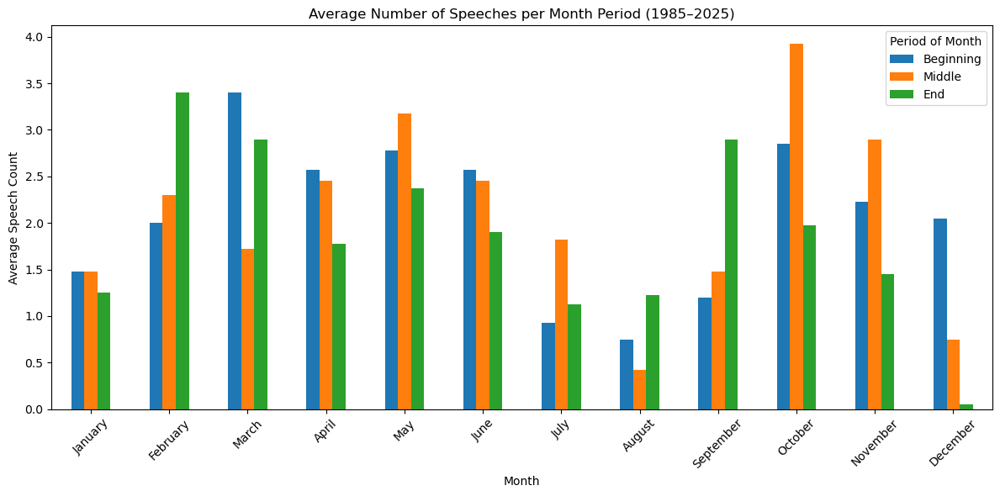

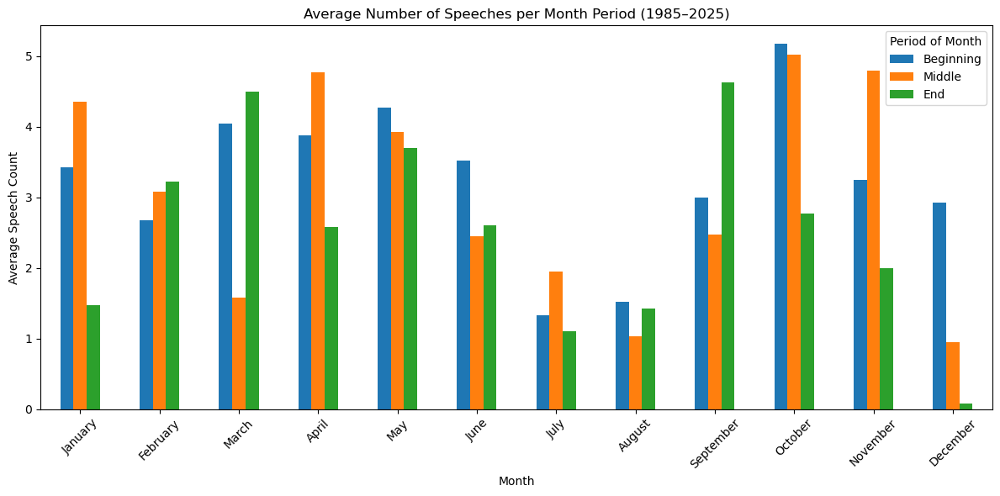

In [55]:
dfgov = df[df['District'] == 'BoardGovernors'].copy()
graphMonthlyPattern(dfgov)

dfgov = df[df['District'] != 'BoardGovernors'].copy()
graphMonthlyPattern(dfgov)

## Textual Complexity (variable dimension)
- All samples from 1985 - 2025
- excluding all the mult + video + article

In [137]:
# some information on the article or not
# How many pieces are mulitple speakers; video format (and both since it is usually the case); and article
statusList = ['MultSpeakers', 'VideoForm', 'Article']
for var in statusList:
    print('Number of speeches that is '+var)
    print(df[var].value_counts())

print('Speeches that are both multiple and video form')
print(df[['MultSpeakers', 'VideoForm']].value_counts())

# excluding video, mult, article: cannot use == False because there are missing values in Mult
dfog = dfPC[(dfPC['MultSpeakers'] != True) & (dfPC['VideoForm'] != True) & (dfPC['Article'] != True)]

# List out name of banks
bankList = ['NewYork', 'Atlanta', 'SanFrancisco', 'Chicago', 'Cleveland', 'Philadelphia', 'Richmond',
           'StLouis', 'Boston', 'Dallas', 'Kansas','Minneapolis']


Number of speeches that is MultSpeakers
MultSpeakers
0.0    585
1.0     48
Name: count, dtype: int64
Number of speeches that is VideoForm
VideoForm
False    7201
True       38
Name: count, dtype: int64
Number of speeches that is Article
Article
False    7235
True        4
Name: count, dtype: int64
Speeches that are both multiple and video form
MultSpeakers  VideoForm
0.0           False        584
1.0           True          37
              False         11
0.0           True           1
Name: count, dtype: int64


In [139]:
# Removing tops outliers for info
n = 2
top_n_indices = dfog.nlargest(n, 'info').index
dfog2 = dfog.drop(index=top_n_indices)

# also removing tops outliers for read
n = 2
top_n_indices = dfog2.nlargest(n, 'read').index
dfog2 = dfog2.drop(index=top_n_indices)


### Board vs bank

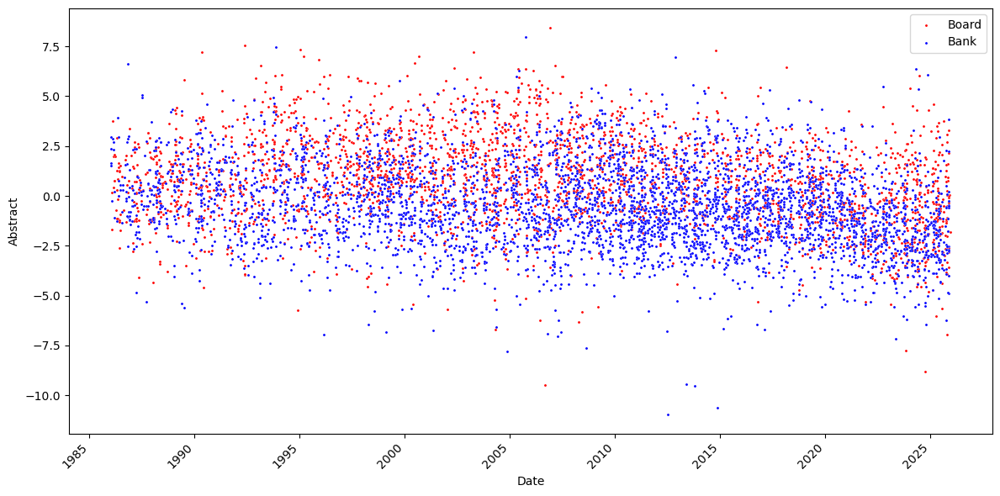

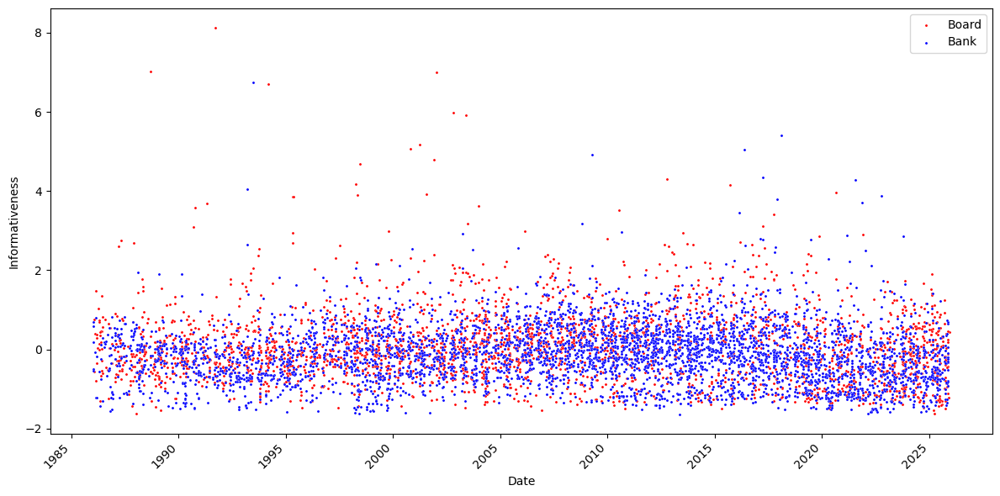

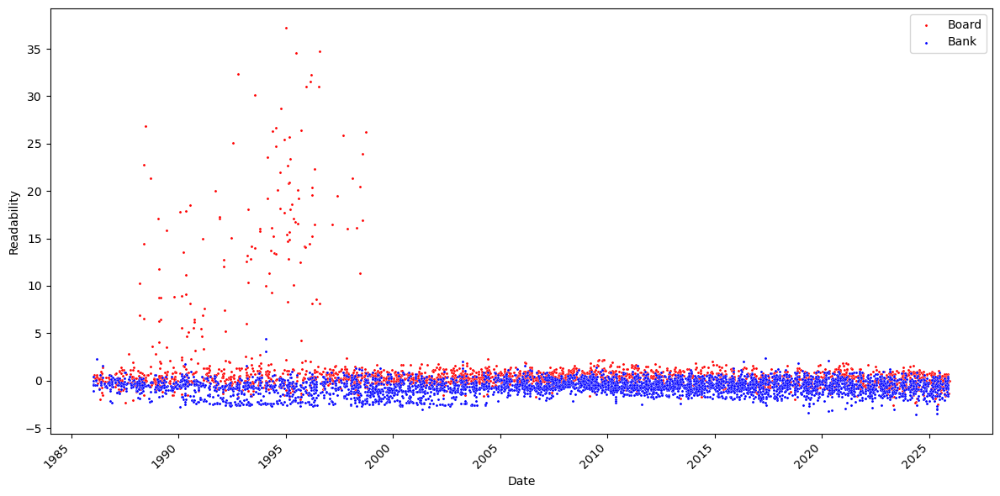

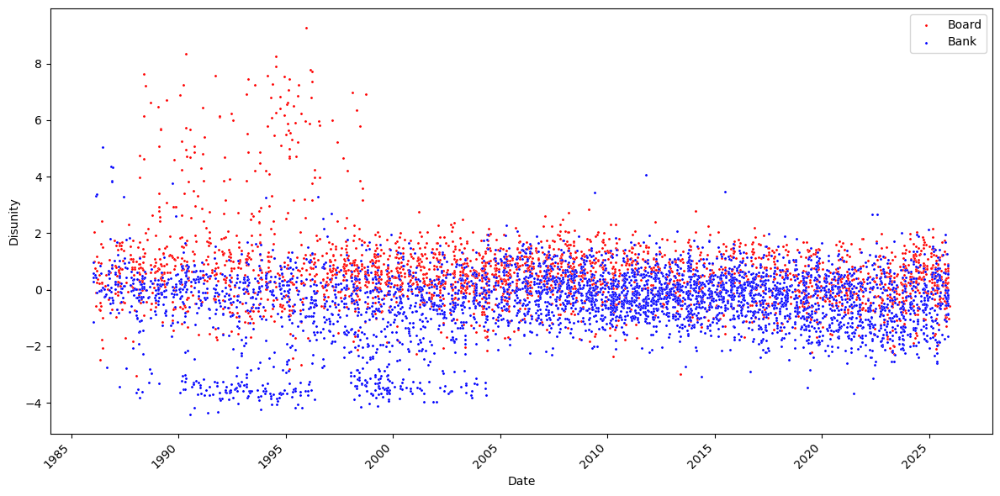

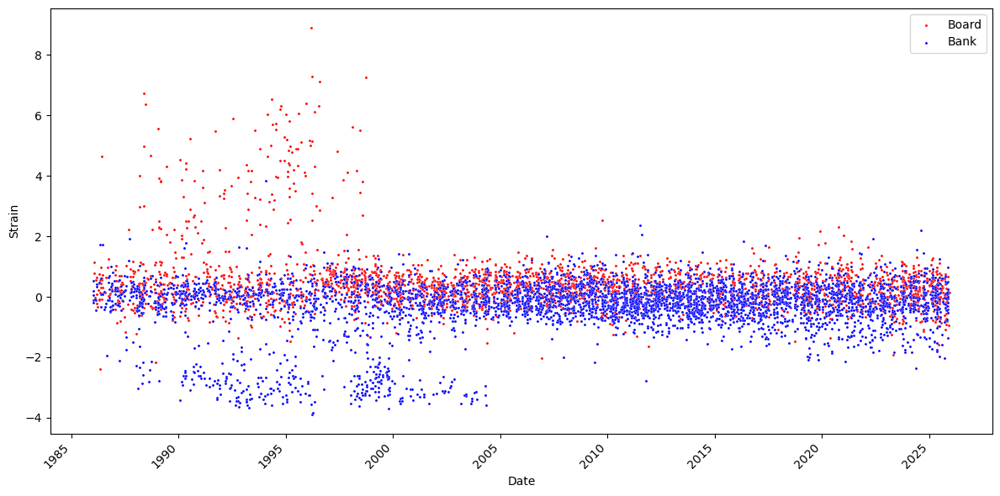

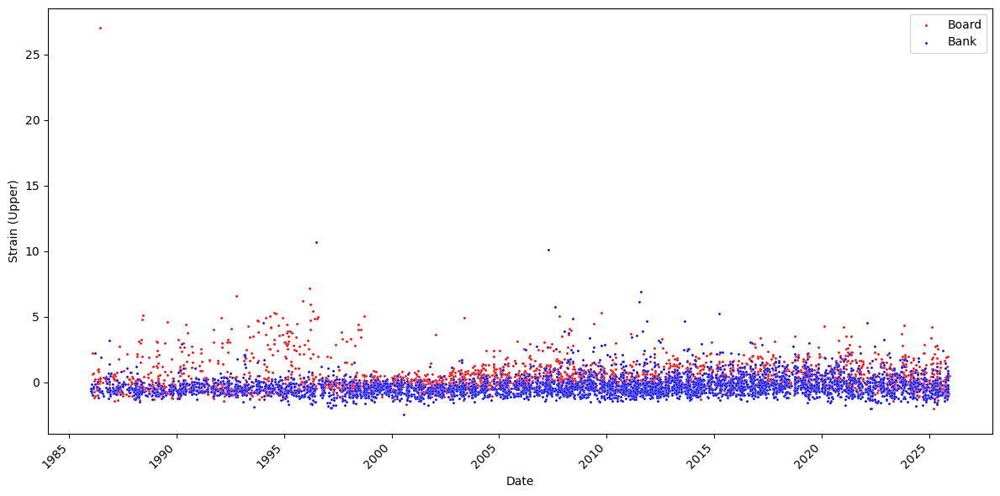

In [142]:
# board vs bank
dfrestrict1 = dfog2[dfog2['District']== 'BoardGovernors'].copy()
dfrestrict2 = dfog2[dfog2['District']!= 'BoardGovernors'].copy()
varNameList = ["Abstract", "Informativeness","Readability","Disunity","Strain","Strain (Upper)"]

for var, name in zip(nameList,varNameList):
    plt.figure(figsize=(12, 6)) 
    sns.scatterplot(x='date', y=var, data=dfrestrict1, label='Board', color='red', s=5)
    sns.scatterplot(x='date', y=var, data=dfrestrict2, label='Bank', color='blue', s=5)
    # plt.axvline(dt.datetime(2024, 11, 5), color = 'r', linewidth=0.6)
    # plt.axvline(dt.datetime(2025, 1, 20), color = 'r', linewidth=0.6)
    # plt.title('Scatter Plot of '+var+' Over Time')
    # for dateElement in chairPeriodList:
    #         plt.axvline(dt.datetime(dateElement[0], dateElement[1], dateElement[2]), color = 'r', linewidth=0.6)
    
    plt.xlabel('Date')
    plt.ylabel(name)
    
    plt.xticks(rotation=45, ha='right') # Rotate date labels for better readability
    plt.tight_layout() # Adjust layout to prevent labels from overlapping
    plt.legend()
    # plt.show() # Display the scatter plot
    plt.savefig("Graphs/ScatterBoardBank/"+var+".png", bbox_inches="tight")


In [143]:
dfrestrict1['speaker'].value_counts()

speaker
Alan Greenspan                491
Ben S Bernanke                269
Jerome H. Powell              150
Roger W Ferguson              140
Michelle W. Bowman            133
Lael Brainard                 110
John Patrick LaWare           102
Laurence H Meyer               94
Donald L Kohn                  90
Janet L. Yellen                84
Susan Schmidt Bies             82
Daniel K Tarullo               77
Christopher J. Waller          73
Edward M Gramlich              68
Randal K Quarles               62
Susan M Phillips               57
Mark W Olson                   53
Elizabeth A Duke               52
Edward W Kelley                52
Michael S. Barr                51
Randall S Kroszner             49
Stanley Fischer                45
Lisa D. Cook                   45
Lawrence B. Lindsey            44
Wayne D Angell                 44
Manuel H Johnson               43
Richard H Clarida              42
H Robert Heller                37
Philip N. Jefferson            32
Freder

In [144]:
# I would like to know in the data, what is the first and last time making speeches, 
# and compare it to the fed website: https://www.federalreserve.gov/aboutthefed/bios/board/boardmembership.htm
dummy = dfrestrict1['speaker'].value_counts().index.tolist()
for name in dummy:
    dfdummy = dfrestrict1[dfrestrict1['speaker'] == name]
    print("For "+name+", the speeches are available from: \n")
    print(dfdummy['date'].min())
    print(dfdummy['date'].max())
    print("\n")


For Alan Greenspan, the speeches are available from: 

1987-09-09 00:00:00
2005-12-14 00:00:00


For Ben S Bernanke, the speeches are available from: 

2002-10-15 00:00:00
2014-01-03 00:00:00


For Jerome H. Powell, the speeches are available from: 

2013-02-22 00:00:00
2025-12-01 00:00:00


For Roger W Ferguson, the speeches are available from: 

1998-03-04 00:00:00
2006-04-17 00:00:00


For Michelle W. Bowman, the speeches are available from: 

2019-02-11 00:00:00
2025-10-30 00:00:00


For Lael Brainard, the speeches are available from: 

2014-12-02 00:00:00
2023-01-19 00:00:00


For John Patrick LaWare, the speeches are available from: 

1988-09-08 00:00:00
1995-02-14 00:00:00


For Laurence H Meyer, the speeches are available from: 

1996-09-08 00:00:00
2002-12-18 00:00:00


For Donald L Kohn, the speeches are available from: 

2002-11-22 00:00:00
2010-05-13 00:00:00


For Janet L. Yellen, the speeches are available from: 

1996-03-13 00:00:00
2017-11-29 00:00:00


For Susan Schmid

Looking good, no cases of non-aligned.

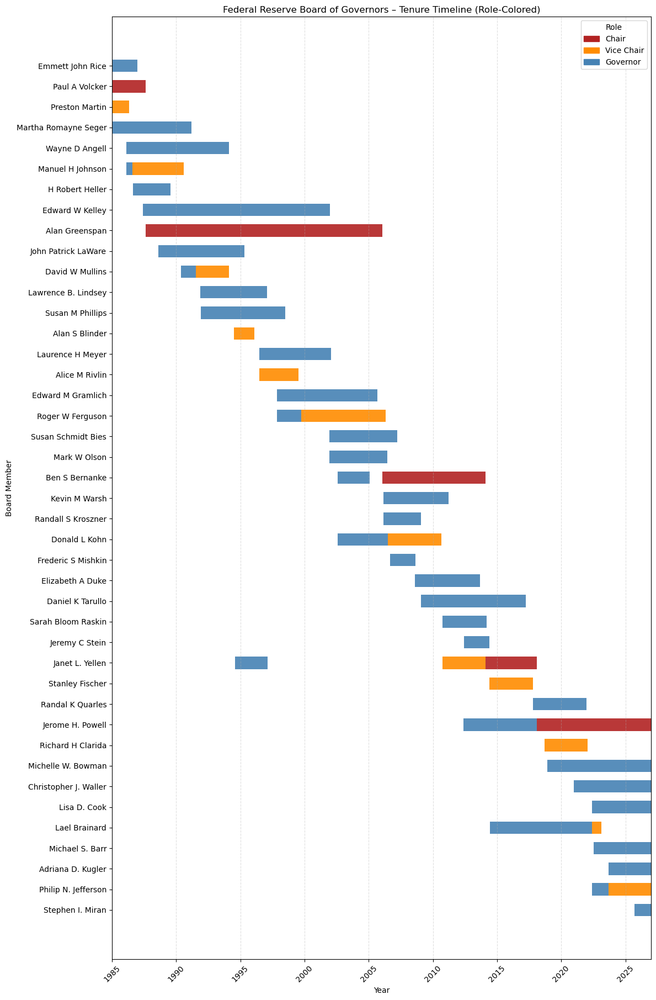

In [146]:
# Gantt Chart instead of a table like for bank presidents
# use the role_periods
# for yellen, she was a bank president at the blank points 
# https://www.federalreservehistory.org/people/janet-l-yellen

import matplotlib.dates as mdates

# Convert role_periods dictionary into a DataFrame
rows = []
for name, periods in role_periods.items():
    for start, end, role in periods:
        rows.append({
            "name": name,
            "start": pd.to_datetime(start),
            "end": pd.to_datetime(end),
            "role": role
        })

dfbgrole = pd.DataFrame(rows)
dfbgrole["duration"] = (dfbgrole["end"] - dfbgrole["start"]).dt.days

# Sort by start date (newest at top)
dfbgrole = dfbgrole.sort_values("start", ascending=False)

# Color map for roles
role_colors = {
    "Chair": "firebrick",
    "Vice Chair": "darkorange",
    "Governor": "steelblue"
}

# Create the Gantt chart
fig, ax = plt.subplots(figsize=(12, 18))

for i, row in dfbgrole.iterrows():
    ax.barh(
        y=row["name"],
        width=row["duration"],
        left=row["start"],
        color=role_colors[row["role"]],
        height=0.6,
        alpha=0.9
    )

# Formatting
ax.set_xlabel("Year")
ax.set_ylabel("Board Member")
ax.set_title("Federal Reserve Board of Governors – Tenure Timeline (Role‑Colored)")

# Year ticks every 2 years
ax.xaxis.set_major_locator(mdates.YearLocator(5))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))

# Gridlines for readability
ax.grid(axis="x", linestyle="--", alpha=0.4)

# Legend
handles = [
    plt.Rectangle((0,0),1,1, color=role_colors["Chair"]),
    plt.Rectangle((0,0),1,1, color=role_colors["Vice Chair"]),
    plt.Rectangle((0,0),1,1, color=role_colors["Governor"])
]
ax.legend(handles, ["Chair", "Vice Chair", "Governor"], title="Role")
ax.set_xlim(pd.to_datetime("1985-01-01"), pd.to_datetime("2026-12-31"))

plt.tight_layout()
plt.xticks(rotation=45)
plt.rcParams.update({'xtick.labelsize': 8})
fig.savefig("Graphs/fed_board_gantt.pdf", bbox_inches="tight")
# plt.show()

In [147]:
dfog2[dfog2['board_role']=='Chair']['speaker'].value_counts()

speaker
Alan Greenspan      491
Ben S Bernanke      224
Jerome H. Powell     96
Janet L. Yellen      57
Paul A Volcker       24
Name: count, dtype: int64

FOR VARIABLE abstract
FOR ROLE Governor
FOR ROLE Chair
FOR ROLE Vice Chair
FOR VARIABLE info
FOR ROLE Governor
FOR ROLE Chair
FOR ROLE Vice Chair
FOR VARIABLE read
FOR ROLE Governor
FOR ROLE Chair
FOR ROLE Vice Chair
FOR VARIABLE disunity
FOR ROLE Governor
FOR ROLE Chair
FOR ROLE Vice Chair
FOR VARIABLE strain
FOR ROLE Governor
FOR ROLE Chair
FOR ROLE Vice Chair
FOR VARIABLE strainUpper
FOR ROLE Governor
FOR ROLE Chair
FOR ROLE Vice Chair


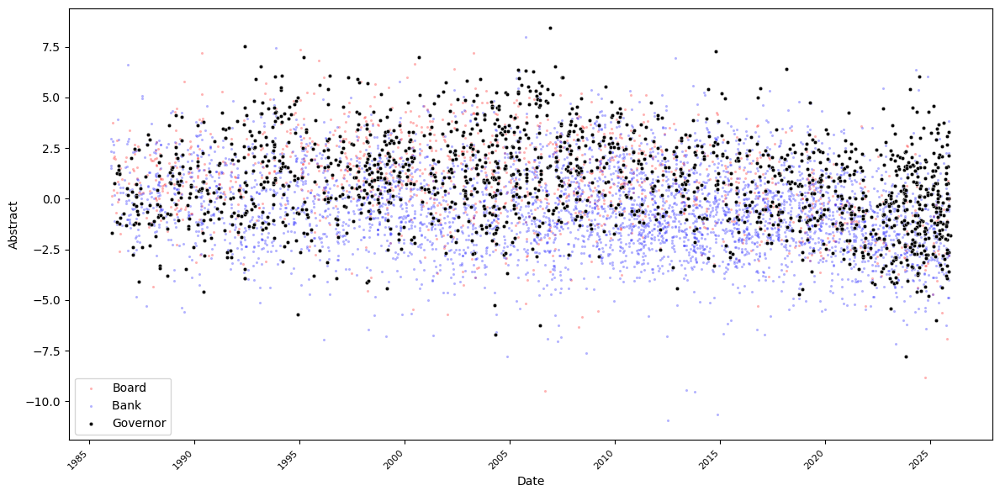

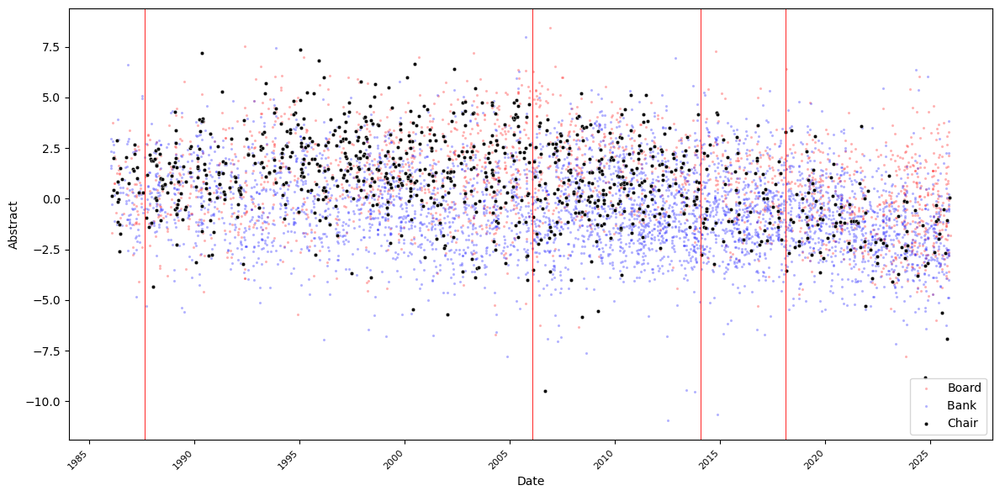

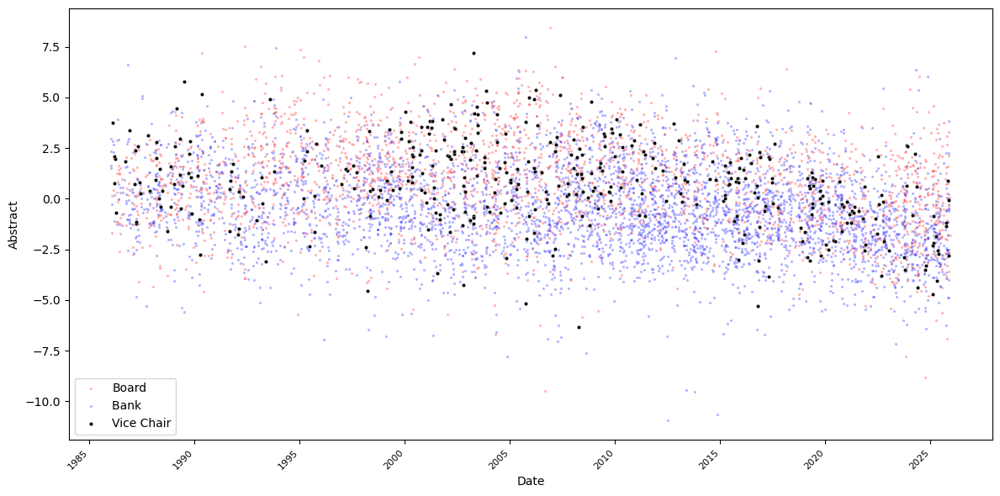

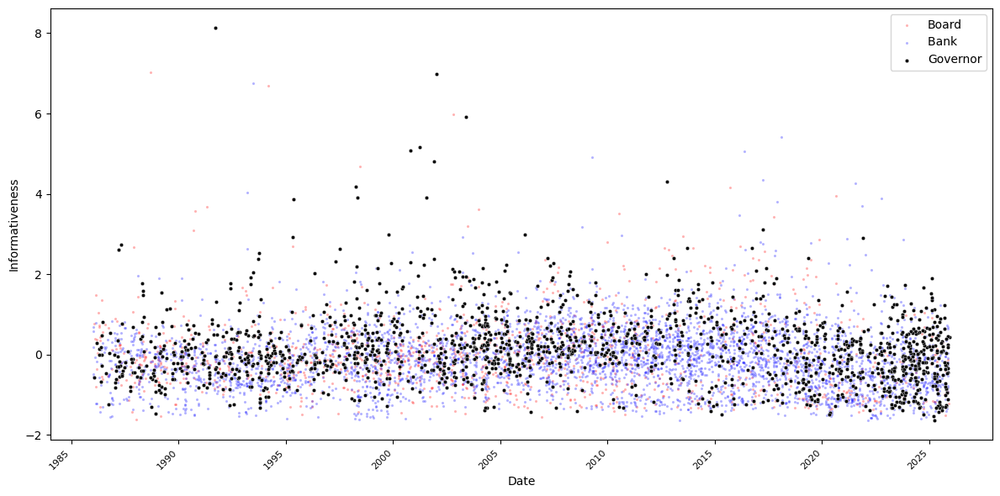

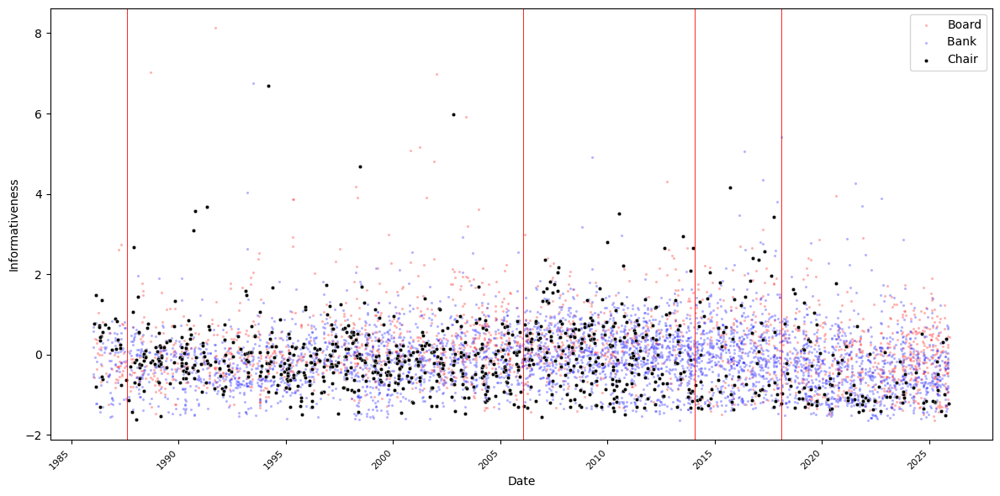

...

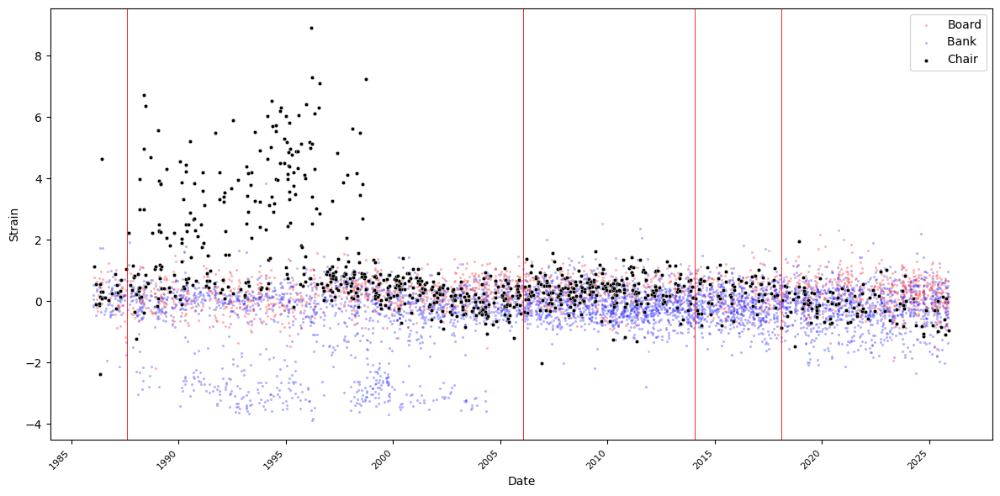

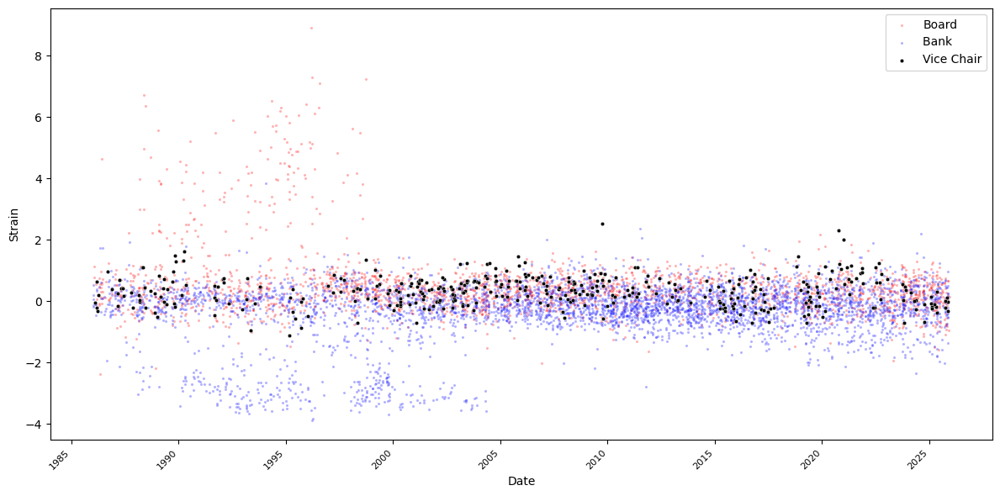

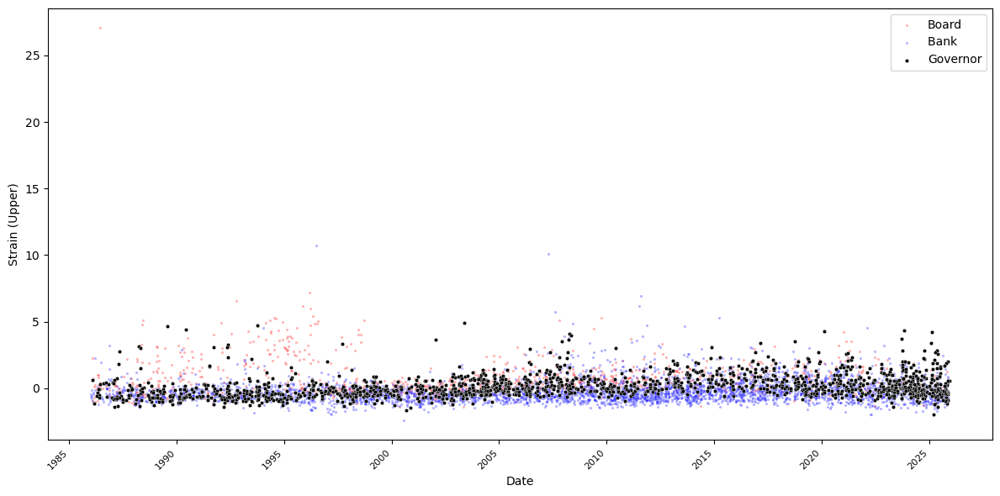

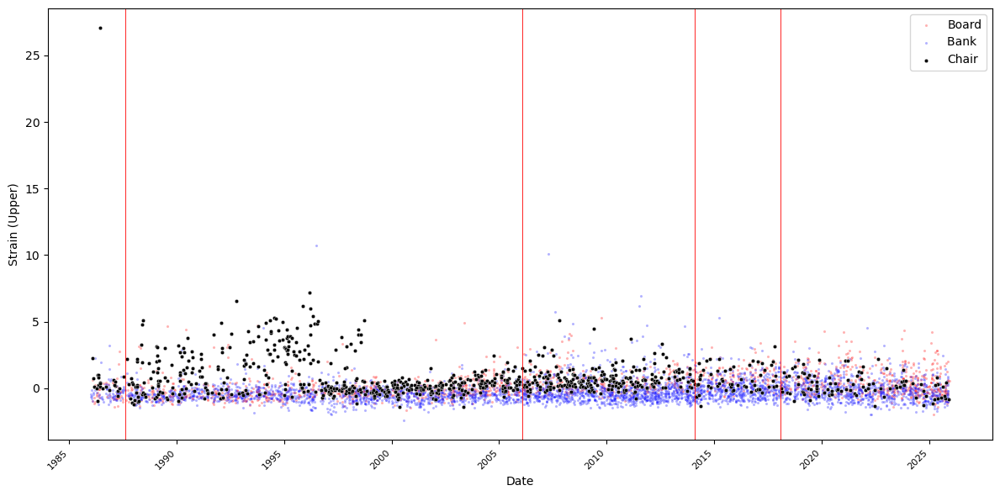

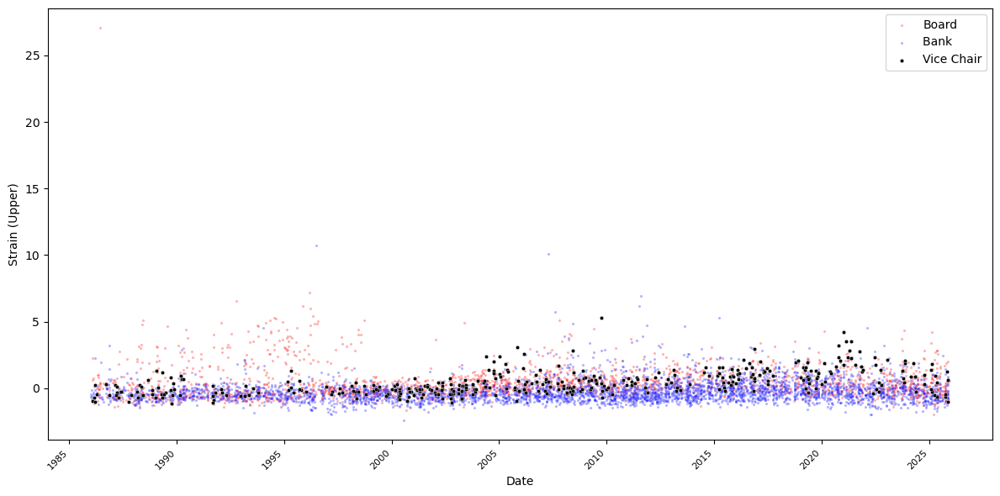

In [153]:
# Now graph it again but with roles in
# board vs bank with detail roles
roleList = ['Governor', 'Chair', 'Vice Chair']
varNameList = ["Abstract", "Informativeness","Readability","Disunity","Strain","Strain (Upper)"]
dfrestrict3 = dfog2[dfog2['District']!= 'BoardGovernors'].copy()

for var, name in zip(nameList,varNameList):
    print('FOR VARIABLE '+var)
    for role in roleList:
        print('FOR ROLE '+ role)
        dfrestrict2 = dfog2[dfog2['board_role']== role].copy()
        dfrestrict1 = dfog2[(dfog2['District']== 'BoardGovernors') & (dfog['board_role']!= role)].copy()
        
        plt.figure(figsize=(12, 6)) 
        sns.scatterplot(x='date', y=var, data=dfrestrict1, label='Board', color='red',s=5,alpha = 0.3)
        sns.scatterplot(x='date', y=var, data=dfrestrict3, label='Bank ', color='blue',s=5,alpha = 0.3)
        sns.scatterplot(x='date', y=var, data=dfrestrict2, label=role, color='black',s=10,alpha = 1)

        if role == "Chair":
            for dateElement in chairPeriodList:
                plt.axvline(dt.datetime(dateElement[0], dateElement[1], dateElement[2]), color = 'r', linewidth=0.6)
            
        # plt.title('Scatter Plot of '+var+' Over Time')
        plt.xlabel('Date')
        plt.ylabel(name)
        
        plt.xticks(rotation=45, ha='right') # Rotate date labels for better readability
        plt.tight_layout() # Adjust layout to prevent labels from overlapping
        plt.legend()
        # plt.show() # Display the scatter plot
        plt.savefig("Graphs/ScatterBoardDetails/"+var+role+".png", bbox_inches="tight")




### Textual complexity (bank dimension)

In [155]:
# excluding video, mult, article: cannot use == False because there are missing values in Mult
dfog = dfPC[(dfPC['MultSpeakers'] != True) & (dfPC['VideoForm'] != True) & (dfPC['Article'] != True)]

# Removing tops outliers for info
n = 2
top_n_indices = dfog.nlargest(n, 'info').index
dfog2 = dfog.drop(index=top_n_indices)

# also removing tops outliers for read
n = 2
top_n_indices = dfog2.nlargest(n, 'read').index
dfog2 = dfog2.drop(index=top_n_indices)


In [157]:
# just a checking again for the speakers:
dfrestrict2 = dfog2[dfog2['District']!= 'BoardGovernors'].copy()
for bank in bankList:
    dummy = dfrestrict2[dfrestrict2['District'] == bank].copy()
    print("For "+bank+", the speeches are from: \n")
    listDum = dummy['speaker'].value_counts()
    print(listDum)
    listDum = listDum.index.tolist()
    print(listDum)
    print("For these people, here is there begin and end speech date: \n")
    for i in listDum:
        print(i)
        dummy2 = dummy[dummy['speaker'] == i]
        print(dummy2['date'].min())
        print(dummy2['date'].max())
        print("\n")
    print("#"*40)



For NewYork, the speeches are from: 

speaker
William C. Dudley       170
John C. Williams        102
William J. McDonough     74
Timothy F. Geithner      45
Simon M. Potter          33
Ernest T Patrikis        21
Kevin Stiroh             20
Thomas C Baxter          16
Lorie K. Logan           14
Michael Held             13
James McAndrews          12
Roberto Perli            10
Christine M Cumming       9
Michelle Neal             9
William L Rutledge        8
Brian P Sack              8
Sarah Dahlgren            7
Terrence J Checki         6
Beverly Hirtle            6
Jamie B Stewart           6
Richard Dzina             5
Peter R Fisher            5
Nathaniel Wuerffel        5
Daleep Singh              5
James Hennessy            5
Joshua Rosenberg          4
Alberto G Musalem         4
Joseph S Tracy            4
Dino Kos                  4
Chris Calabia             4
Anna Nordstrom            3
Dianne Dobbeck            3
Anna Kovner               2
Jack Gutt                 2
Ju

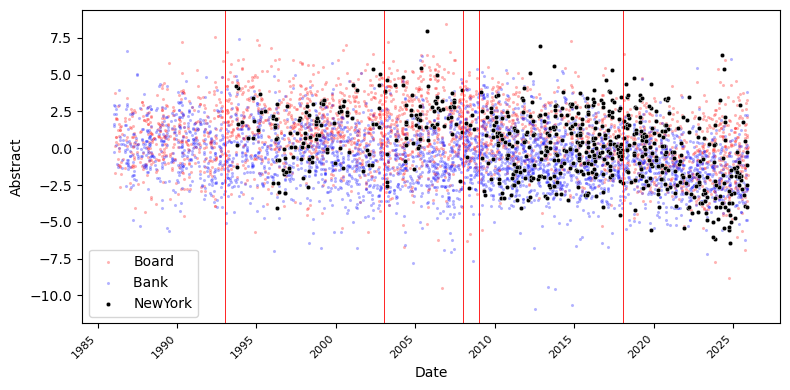

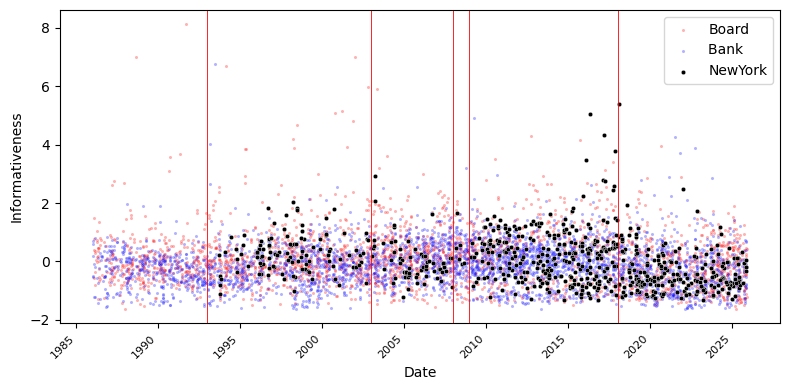

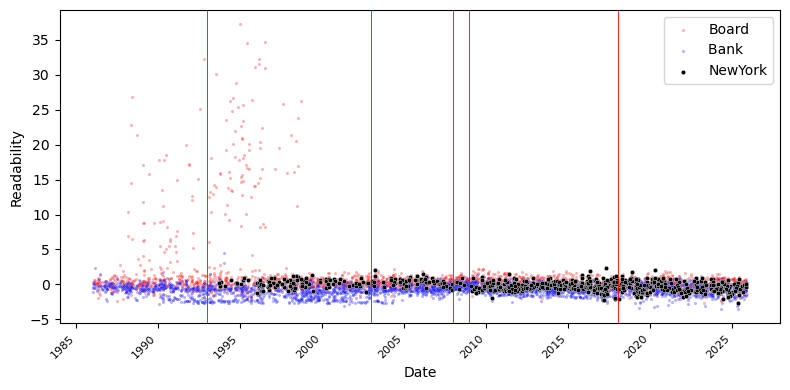

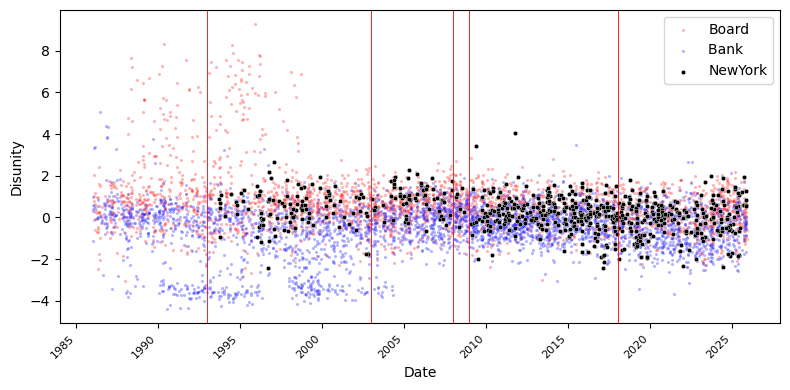

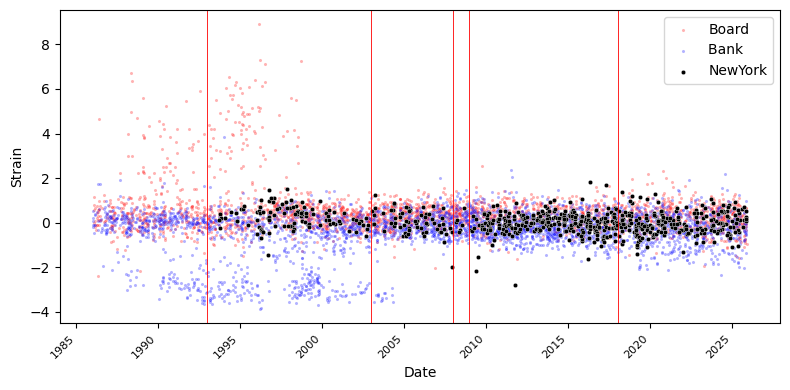

...

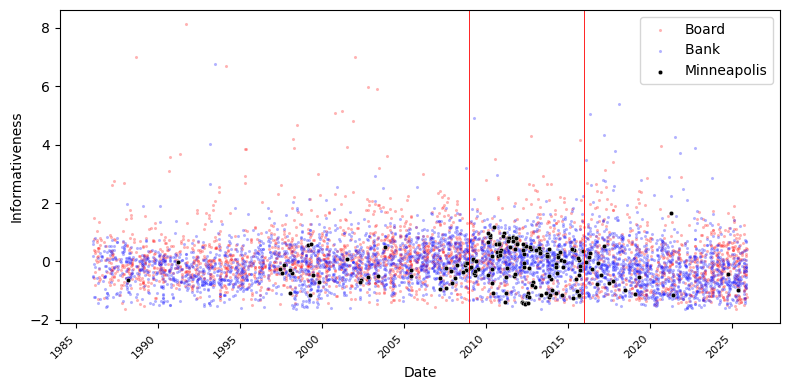

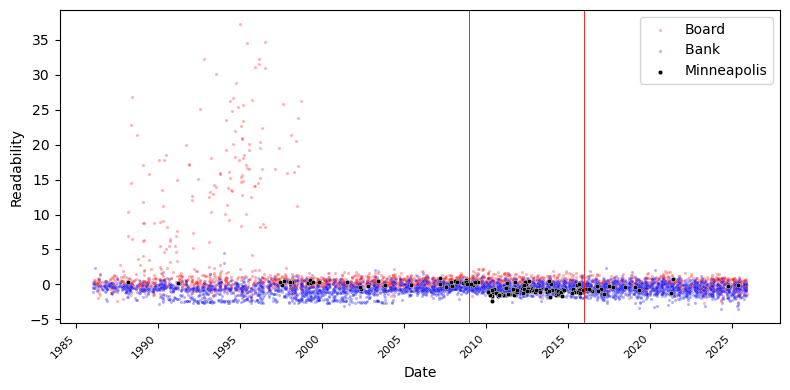

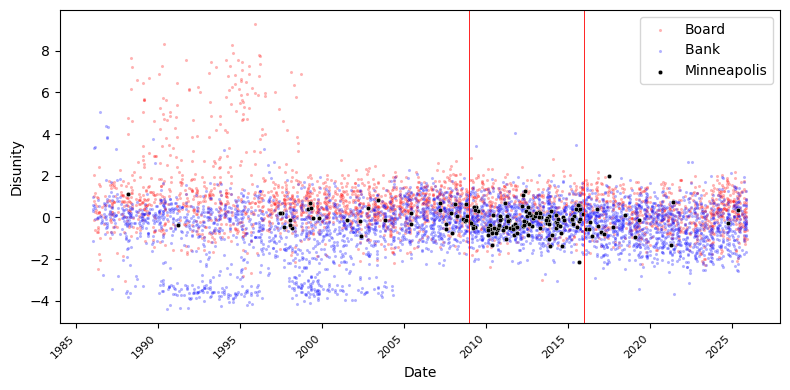

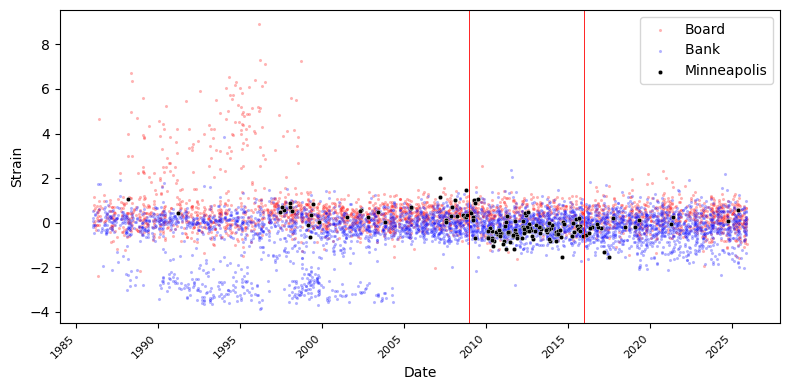

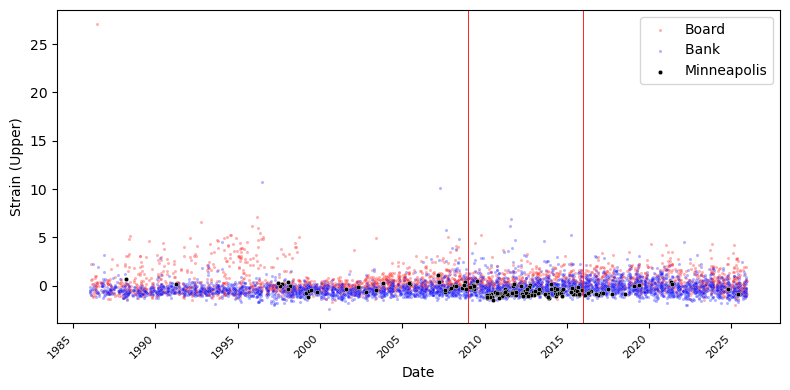

In [160]:
# board, bank vs 1 more bank president
dfrestrict1 = dfog2[dfog2['District']== 'BoardGovernors'].copy()
varNameList = ["Abstract", "Informativeness","Readability","Disunity","Strain","Strain (Upper)"]

for (ibank, bank) in enumerate(bankList):
    # print('FOR BANKS '+bank)
    transdatelist = bankPeriodList[ibank]
    for var, name in zip(nameList,varNameList):
        # print('FOR VARIABLES '+ var)
        dfrestrict2 = dfog2[dfog2['District']== bank].copy()
        dfrestrict3 = dfog2[(dfog2['District']!= 'BoardGovernors') & (dfog['District']!= bank)].copy()
        
        plt.figure(figsize=(8, 4)) 
        sns.scatterplot(x='date', y=var, data=dfrestrict1, label='Board', color='red',s=5,alpha = 0.3)
        sns.scatterplot(x='date', y=var, data=dfrestrict3, label='Bank ', color='blue',s=5,alpha = 0.3)
        sns.scatterplot(x='date', y=var, data=dfrestrict2, label=bank, color='black',s=10,alpha = 1)
        
        for dateElement in transdatelist:
            plt.axvline(dt.datetime(dateElement[0], dateElement[1], dateElement[2]), color = 'r', linewidth=0.6)

        # plt.title('Scatter Plot of '+var+' Over Time for district '+bank)
        plt.xlabel('Date')
        plt.ylabel(name)
        
        plt.xticks(rotation=45, ha='right') # Rotate date labels for better readability
        plt.tight_layout() # Adjust layout to prevent labels from overlapping
        plt.legend()
        # plt.show() # Display the scatter plot
        plt.savefig("Graphs/ScatterBankDetails/"+var+bank+".png", bbox_inches="tight")


In [6]:
# # what if only include president
# # board, bank vs 1 more bank president
# dfrestrict1 = dfog2[dfog2['District']== 'BoardGovernors'].copy()

# for (ibank, bank) in enumerate(bankList):
#     # print('FOR BANKS '+bank)
#     transdatelist = bankPeriodList[ibank]
#     for var in nameList:
#         # print('FOR VARIABLES '+ var)
#         dfrestrict2 = dfog2[(dfog2['District']== bank) & (dfog2['IsBpres']== True)].copy()
#         dfrestrict3 = dfog2[(dfog2['District']!= 'BoardGovernors') & (dfog['District']!= bank) & (dfog2['IsBpres']== True)].copy()
        
#         plt.figure(figsize=(8, 4)) 
#         sns.scatterplot(x='date', y=var, data=dfrestrict1, label='gov', color='red',s=5,alpha = 0.3)
#         sns.scatterplot(x='date', y=var, data=dfrestrict3, label='non-gov ', color='blue',s=5,alpha = 0.3)
#         sns.scatterplot(x='date', y=var, data=dfrestrict2, label=bank, color='black',s=10,alpha = 1)
        
#         for dateElement in transdatelist:
#             plt.axvline(dt.datetime(dateElement[0], dateElement[1], dateElement[2]), color = 'r', linewidth=0.6)

#         plt.title('Scatter Plot of '+var+' Over Time for district '+bank)
#         plt.xlabel('Date')
#         plt.ylabel(var)
        
#         plt.xticks(rotation=45, ha='right') # Rotate date labels for better readability
#         plt.tight_layout() # Adjust layout to prevent labels from overlapping
#         plt.legend()
#         # plt.show() # Display the scatter plot
#         plt.savefig("Graphs/ScatterBankDetailsOnlyPres/"+var+bank+".png", bbox_inches="tight")


Below is graphs with the average and standard deviations for each speakers' terms

In [4]:
# # board, bank vs 1 more bank president
# dfrestrict1 = dfog2[dfog2['District']== 'BoardGovernors'].copy()

# for (ibank, bank) in enumerate(bankList):
#     # print('FOR BANKS '+bank)
#     transdatelist = bankPeriodList[ibank]
#     for var in nameList:
#         # print('FOR VARIABLES '+ var)
#         dfrestrict2 = dfog2[dfog2['District']== bank].copy()
#         dfrestrict3 = dfog2[(dfog2['District']!= 'BoardGovernors') & (dfog['District']!= bank)].copy()
        
#         plt.figure(figsize=(8, 4)) 
#         sns.scatterplot(x='date', y=var, data=dfrestrict1, label='gov', color='red',s=5,alpha = 0.3)
#         sns.scatterplot(x='date', y=var, data=dfrestrict3, label='non-gov ', color='blue',s=5,alpha = 0.3)
#         sns.scatterplot(x='date', y=var, data=dfrestrict2, label=bank, color='black',s=10,alpha = 1)
        
#         for dateElement in transdatelist:
#             plt.axvline(dt.datetime(dateElement[0], dateElement[1], dateElement[2]), color = 'r', linewidth=0.6)

#         # Convert transition dates to datetime
#         transition_dates = [dt.datetime(y, m, d) for (y, m, d) in transdatelist]
#         transition_dates = sorted(transition_dates)
        
#         # Add an artificial end date (max date in your data)
#         transition_dates.append(dfrestrict2['date'].max())

#         for i in range(len(transition_dates)-1):
#             start = transition_dates[i]
#             end   = transition_dates[i+1]
        
#             # Slice the data for this interval
#             mask = (dfrestrict2['date'] >= start) & (dfrestrict2['date'] < end)
#             segment = dfrestrict2.loc[mask, var]
        
#             if len(segment) > 0:
#                 mean_val = segment.mean()
#                 std_val  = segment.std()
        
#                 # Horizontal mean line
#                 plt.hlines(mean_val, xmin=start, xmax=end, 
#                            colors='green', linestyles='--', linewidth=1.2)
        
#                 # Optional shaded band for ±1 std
#                 plt.fill_between([start, end],
#                                  [mean_val - std_val, mean_val - std_val],
#                                  [mean_val + std_val, mean_val + std_val],
#                                  color='green', alpha=0.15)

#         plt.title('Scatter Plot of '+var+' Over Time for district '+bank)
#         plt.xlabel('Date')
#         plt.ylabel(var)
        
#         plt.xticks(rotation=45, ha='right') # Rotate date labels for better readability
#         plt.tight_layout() # Adjust layout to prevent labels from overlapping
#         plt.legend()
#         # plt.show() # Display the scatter plot
#         plt.savefig("Graphs/Testing/"+var+bank+".png", bbox_inches="tight")


In [1]:

# # what if only include president & show ranges
# # board, bank vs 1 more bank president
# dfrestrict1 = dfog2[dfog2['District']== 'BoardGovernors'].copy()

# for (ibank, bank) in enumerate(bankList):
#     # print('FOR BANKS '+bank)
#     transdatelist = bankPeriodList[ibank]
#     for var in nameList:
#         # print('FOR VARIABLES '+ var)
#         dfrestrict2 = dfog2[(dfog2['District']== bank) & (dfog2['IsBpres']== True)].copy()
#         dfrestrict3 = dfog2[(dfog2['District']!= 'BoardGovernors') & (dfog['District']!= bank) & (dfog2['IsBpres']== True)].copy()
        
#         plt.figure(figsize=(8, 4)) 
#         sns.scatterplot(x='date', y=var, data=dfrestrict1, label='gov', color='red',s=5,alpha = 0.3)
#         sns.scatterplot(x='date', y=var, data=dfrestrict3, label='non-gov ', color='blue',s=5,alpha = 0.3)
#         sns.scatterplot(x='date', y=var, data=dfrestrict2, label=bank, color='black',s=10,alpha = 1)
        
#         for dateElement in transdatelist:
#             plt.axvline(dt.datetime(dateElement[0], dateElement[1], dateElement[2]), color = 'r', linewidth=0.6)

#         # Convert transition dates to datetime
#         transition_dates = [dt.datetime(y, m, d) for (y, m, d) in transdatelist]
#         transition_dates = sorted(transition_dates)
        
#         # Add an artificial end date (max date in your data)
#         transition_dates.append(dfrestrict2['date'].max())

#         for i in range(len(transition_dates)-1):
#             start = transition_dates[i]
#             end   = transition_dates[i+1]
        
#             # Slice the data for this interval
#             mask = (dfrestrict2['date'] >= start) & (dfrestrict2['date'] < end)
#             segment = dfrestrict2.loc[mask, var]
        
#             if len(segment) > 0:
#                 mean_val = segment.mean()
#                 std_val  = segment.std()
        
#                 # Horizontal mean line
#                 plt.hlines(mean_val, xmin=start, xmax=end, 
#                            colors='green', linestyles='--', linewidth=1.2)
        
#                 # Optional shaded band for ±1 std
#                 plt.fill_between([start, end],
#                                  [mean_val - std_val, mean_val - std_val],
#                                  [mean_val + std_val, mean_val + std_val],
#                                  color='green', alpha=0.15)

#         plt.title('Scatter Plot of '+var+' Over Time for district '+bank)
#         plt.xlabel('Date')
#         plt.ylabel(var)
        
#         plt.xticks(rotation=45, ha='right') # Rotate date labels for better readability
#         plt.tight_layout() # Adjust layout to prevent labels from overlapping
#         plt.legend()
#         # plt.show() # Display the scatter plot
#         plt.savefig("Graphs/Testing/"+var+bank+".png", bbox_inches="tight")
